In [1]:
import jams.display
from IPython.display import Audio, display
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sys

sys.path.append('..')
from src import chords, chords_experiment

%matplotlib inline

# Homework 2
<div class="alert alert-block alert-success">

* For this assignment, do not create a separate PDF. I will look to this notebook for your plots, analysis, and responses.
* Use the validation set when experimenting with parameters. Only use the test set at the end.

</div>

## Part 1

<div class="alert alert-block alert-success">
    
1. After implementing all of the functions in `chords.py`, run the experiment, `chords_experiment.run(data_split='validation')`. This tests variants of chord recognizers on the validation set. (This may take some time to run... Try testing on a limited set first using the `limit` argument)
1. Create a notched boxplot of the "root accuracy" results using `seaborn`.
    
</div>

In [2]:
# YOUR CODE GOES HERE
experiment = chords_experiment.run(data_split='validation')

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 12%|█▏        | 7/59 [00:19<02:25,  2.79s/it]..\src\chords.py:209: RuntimeWarning: invalid value encountered in double_scalars
  y_list.append(np.dot(C, T)/(np.linalg.norm(C)*np.linalg.norm(T)))
 29%|██▉       | 17/59 [00:45<01:42,  2.43s/it]C:\ProgramData\Anaconda3\lib\site-packages\mir_eval\chord.py:699: UserWarning: No reference chords were comparable to estimated chords, returning 0.
  warnings.warn("No reference chords were comparable "
100%|████████

In [12]:
experiment

,thirds,thirds_inv,triads,triads_inv,tetrads,tetrads_inv,root,mirex,majmin,majmin_inv,sevenths,sevenths_inv,underseg,overseg,seg,track_id,condition_id
0,0.073405,0.070526,0.037425,0.037425,0.012235,0.012235,0.093556,0.113912,0.149672,0.149672,0.097862,0.097862,0.976885,0.321618,0.321618,00_BN3-119-G_comp,stft_max
1,0.156464,0.155532,0.143425,0.142494,0.101515,0.101515,0.162052,0.196699,0.176528,0.175382,0.124945,0.124945,0.856152,0.433188,0.433188,00_BN3-154-E_comp,stft_max
2,0.301387,0.201828,0.211310,0.136809,0.140873,0.084659,0.345410,0.305922,0.307365,0.198999,0.225402,0.135458,0.948601,0.260060,0.260060,00_Funk3-112-C#_comp,stft_max
3,0.350266,0.289221,0.273812,0.245957,0.261366,0.233511,0.389937,0.360348,0.365098,0.327956,0.348502,0.311360,0.959551,0.231640,0.231640,00_Funk3-98-A_comp,stft_max
4,0.246180,0.224636,0.137822,0.137822,0.113792,0.113792,0.260266,0.489325,0.275584,0.275584,0.227536,0.227536,0.957274,0.317167,0.317167,00_Jazz3-137-Eb_comp,stft_max
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54,0.425059,0.425059,0.425059,0.425059,0.000000,0.000000,0.425059,0.850333,0.425059,0.425059,0.000000,0.000000,0.731401,0.975359,0.731401,05_Jazz3-137-Eb_comp,madmom_viterbi
55,0.296875,0.246094,0.296875,0.246094,0.000000,0.000000,0.296875,0.296875,0.475000,0.393750,0.000000,0.000000,0.285156,0.953125,0.285156,05_Jazz3-150-C_comp,madmom_viterbi
56,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,0.975856,05_Rock3-117-Bb_comp,madmom_viterbi
57,0.731405,0.187329,0.611798,0.187329,0.611798,0.187329,0.731405,0.699218,0.815785,0.249788,0.815785,0.249788,0.794126,0.976975,0.794126,05_Rock3-148-C_comp,madmom_viterbi


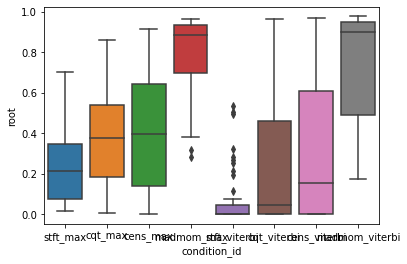

In [11]:
ax = sns.boxplot(x="condition_id", y="root", data=experiment)

<div class="alert alert-block alert-success">
    
**Which variant performed the best? Which variable seems to affect the performance the most? The chroma feature type or the decoding type?**
    
</div>

*YOUR RESPONSE GOES HERE*

I think the madmom_max performed the best. It got the higher root accuracy and distributed more densely. In both of the decoding type, the accuracy is always madmom > cens > cqt > stft, so I will say the chroma feature affect the performance the most.

## Part 2

<div class="alert alert-block alert-success">
    
1. Create a notched boxplot of the "majmin accuracy" results using `seaborn` (`sns.boxplot` with `notch=True`)
    
</div>

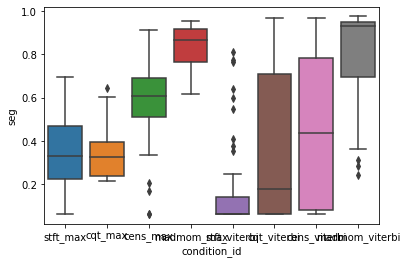

In [24]:
# YOUR CODE GOES HERE
ax = sns.boxplot(x="condition_id", y="seg", data=experiment)

<div class="alert alert-block alert-success">
    
**Which variant performed the best? Which variable seems to affect the performance the most? The chroma feature type or the decoding type?**
    
</div>

*YOUR RESPONSE GOES HERE*

I think the madmom_max performed the best. It got the higher root accuracy and distributed more densely. In both of the decoding type, the accuracy is always madmom > cens > cqt > stft, so I will say the chroma feature affect the performance the most.

## Part 3

<div class="alert alert-block alert-success">
    
1. Improve the performance of the non-`madmom` variants by updating and tuning the `prob` parameter to the viterbi decoding function. (Again, first try this on a subset of files by using the `limit` argument)
1. Update the conditions with this new value.
1. Re-rerun the experiment and replot the results.

</div>

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 12%|█▏        | 7/59 [00:18<02:21,  2.72s/it]..\src\chords.py:209: RuntimeWarning: invalid value encountered in double_scalars
  y_list.append(np.dot(C, T)/(np.linalg.norm(C)*np.linalg.norm(T)))
C:\ProgramData\Anaconda3\lib\site-packages\librosa\sequence.py:1042: RuntimeWarning: invalid value encountered in less
  if np.any(prob < 0) or np.any(prob > 1):
C:\ProgramData\Anaconda3\lib\site-packages\librosa\sequence.py:1042: RuntimeWarning: invalid value enc

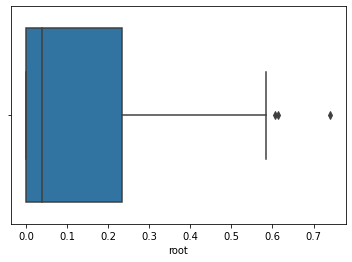

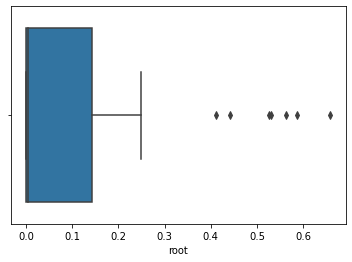

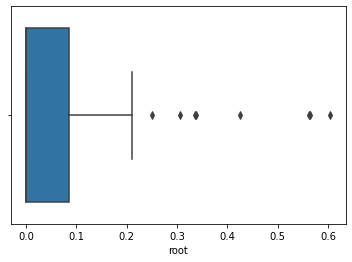

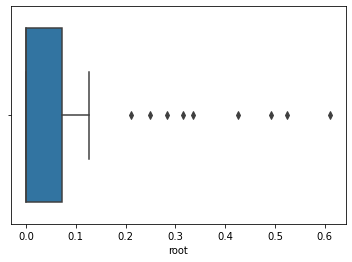

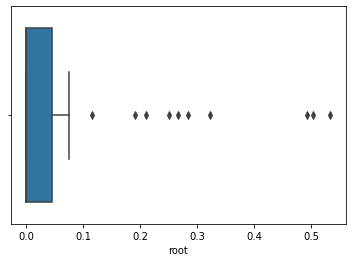

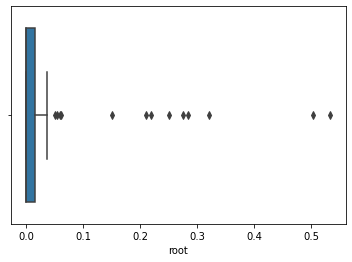

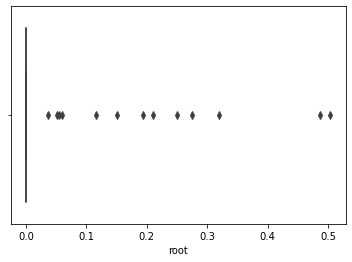

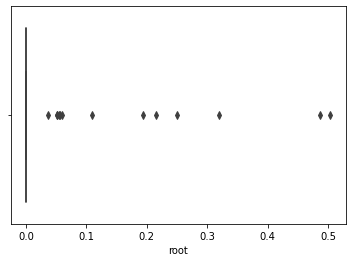

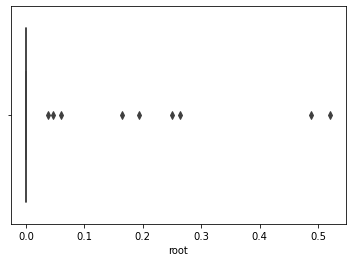

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 29%|██▉       | 17/59 [01:02<02:32,  3.62s/it]C:\ProgramData\Anaconda3\lib\site-packages\mir_eval\chord.py:699: UserWarning: No reference chords were comparable to estimated chords, returning 0.
  warnings.warn("No reference chords were comparable "
100%|██████████| 59/59 [03:31<00:00,  3.58s/it]
INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\

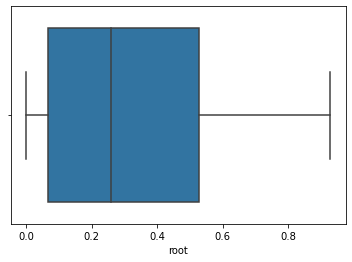

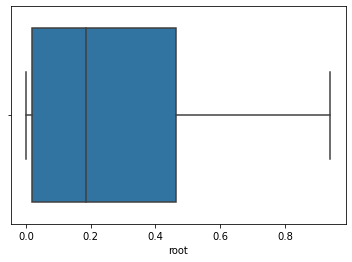

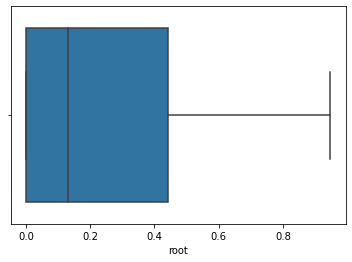

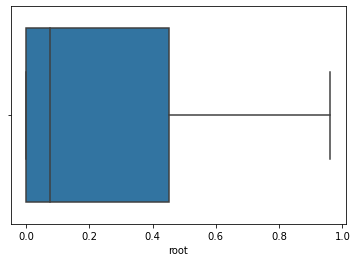

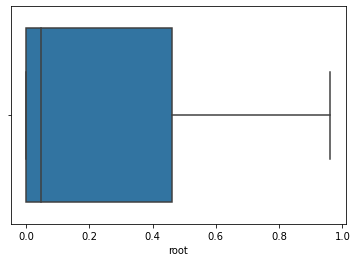

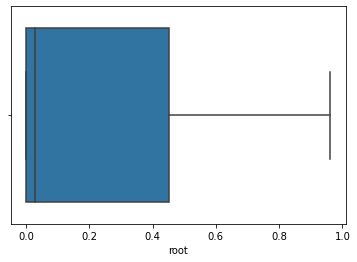

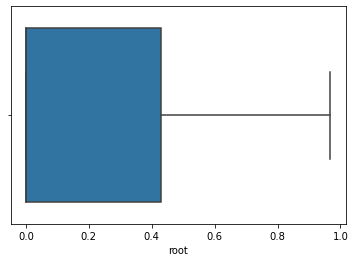

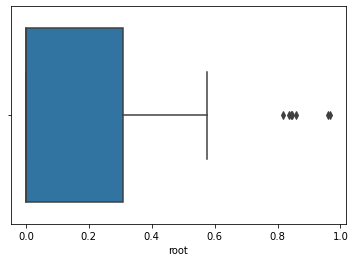

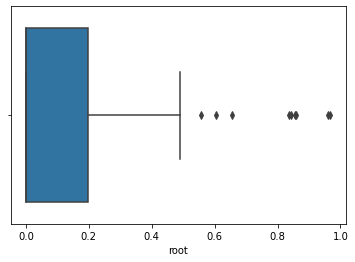

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 29%|██▉       | 17/59 [01:01<02:25,  3.46s/it]C:\ProgramData\Anaconda3\lib\site-packages\mir_eval\chord.py:699: UserWarning: No reference chords were comparable to estimated chords, returning 0.
  warnings.warn("No reference chords were comparable "
100%|██████████| 59/59 [03:32<00:00,  3.61s/it]
INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\

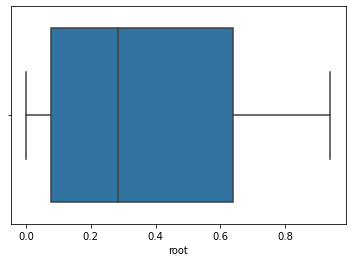

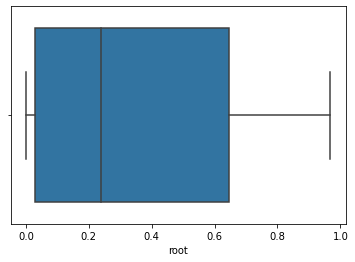

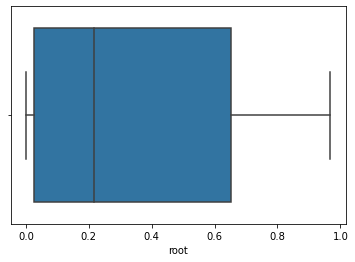

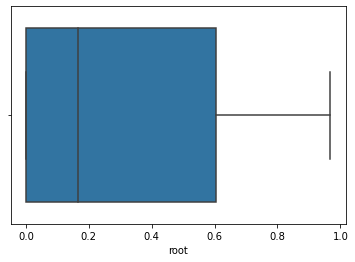

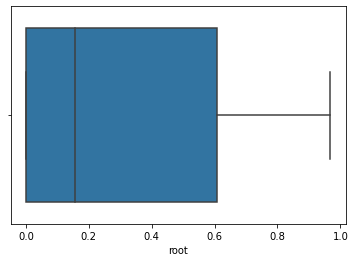

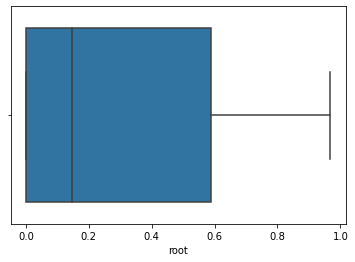

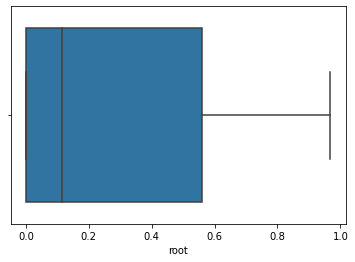

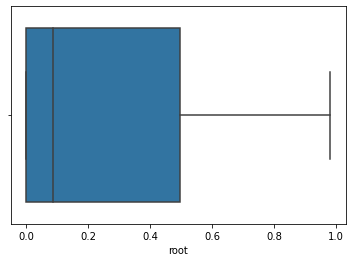

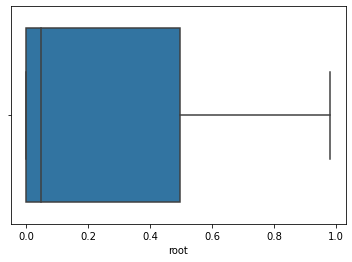

In [23]:
# YOUR CODE GOES HERE
stft = []
for i in np.arange(0.1, 1, 0.1):    
    stft.append(chords_experiment.run_condition(chords.extract_stft_chroma_features, {}, chords.viterbi_decode, {'prob': i},
                  limit=-1, data_split="validation"))
for i in range(len(stft)):
    ax = sns.boxplot(x=stft[i]["root"])
    plt.show()
    
cqt = []
for i in np.arange(0.1, 1, 0.1):    
    cqt.append(chords_experiment.run_condition(chords.extract_cqt_chroma_features, {}, chords.viterbi_decode, {'prob': i},
                  limit=-1, data_split="validation"))
for i in range(len(cqt)):
    ax = sns.boxplot(x=cqt[i]["root"])
    plt.show()
    
cens = []
for i in np.arange(0.1, 1, 0.1):    
    cens.append(chords_experiment.run_condition(chords.extract_cens_chroma_features, {}, chords.viterbi_decode, {'prob': i},
                  limit=-1, data_split="validation"))
for i in range(len(cens)):
    ax = sns.boxplot(x=cens[i]["root"])
    plt.show()

 <div class="alert alert-block alert-success">
    
**What did you change the value to? How much did it improve? Why do you think it improved?**
    
</div>

*YOUR RESPONSE GOES HERE*

I used for loop the test the prob from 0.1 to 0.9 for every chroma feature and seemed that the lower the prob is, the better the results are. 

## Part 4

<div class="alert alert-block alert-success">
    
1. Create a confusion matrix for the output of each variant (condition).
    
</div>

In [ ]:
# YOUR CODE GOES HERE

<div class="alert alert-block alert-success">
    
**Based on the confusion matrix, what kind of mistakes does each variant make?**
    
</div>

*YOUR RESPONSE GOES HERE*

## Part 5

<div class="alert alert-block alert-success">
    
1. Find the best performing variant (if two are equally good, just randomly choose one).
1. For this variant, find the track it performs the worst on and find the track it does the best on.
1. Qualitatively evaluate the output using the `evaluate_qualitative` function and listening to the output with `IPython.display.Audio`
    
</div>

In [49]:
# YOUR CODE GOES HERE
import tqdm


worst_track = experiment[experiment["condition_id"]=="madmom_viterbi"].at[experiment[experiment["condition_id"]=="madmom_viterbi"]["seg"].idxmin(), "track_id"]
best_track = experiment[experiment["condition_id"]=="madmom_viterbi"].at[experiment[experiment["condition_id"]=="madmom_viterbi"]["seg"].idxmax(), "track_id"]

test_tracks, validation_tracks = chords.load_data()

tracks = validation_tracks

for track_id, track in tqdm.tqdm(list(tracks.items())[:-1]):
    if track_id == worst_track:
        est_labels, est_times = chords.estimate_chords(track,
                                                chords.extract_madmom_chroma_features, {},
                                                chords.viterbi_decode, {'prob': 0.5})
        left, right = chords.evaluate_qualitative(track, est_labels, est_times)
        break
        
Audio(np.array([left, right]), rate=44100)

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
  8%|▊         | 5/59 [00:06<01:09,  1.29s/it]


In [50]:
for track_id, track in tqdm.tqdm(list(tracks.items())[:-1]):
    if track_id == best_track:
        est_labels, est_times = chords.estimate_chords(track,
                                                chords.extract_madmom_chroma_features, {},
                                                chords.viterbi_decode, {'prob': 0.5})
        left, right = chords.evaluate_qualitative(track, est_labels, est_times)
        break
        
Audio(np.array([left, right]), rate=44100)

 95%|█████████▍| 56/59 [00:08<00:00,  6.85it/s]


<div class="alert alert-block alert-success">
    
**Describe its performance in the worst case track.**

**Describe its performance in the best case track.**
    
</div>

*YOUR RESPONSE GOES HERE*

In the worst case, the left channel and the right channel can't really match. But in the best case, the sonification seems to match the track more.

## Part 6

<div class="alert alert-block alert-success">
    
1. Improve the performance of one of the non-`madmom` variants by tuning the `kwargs` parameters to the chroma feature function. (Again, first try this on a subset of files by using the `limit` argument) 

</div>

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 12%|█▏        | 7/59 [00:18<02:21,  2.71s/it]..\src\chords.py:209: RuntimeWarning: invalid value encountered in double_scalars
  y_list.append(np.dot(C, T)/(np.linalg.norm(C)*np.linalg.norm(T)))
C:\ProgramData\Anaconda3\lib\site-packages\librosa\sequence.py:1042: RuntimeWarning: invalid value encountered in less
  if np.any(prob < 0) or np.any(prob > 1):
C:\ProgramData\Anaconda3\lib\site-packages\librosa\sequence.py:1042: RuntimeWarning: invalid value enc

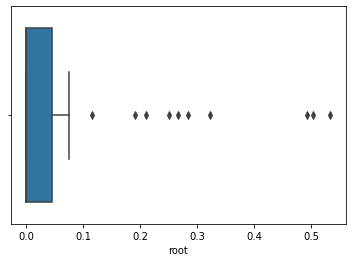

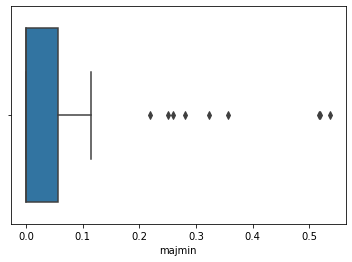

In [71]:
# YOUR CODE GOES HERE
stft = chords_experiment.run_condition(chords.extract_stft_chroma_features, {}, chords.viterbi_decode, {'prob': 0.5},
                  limit=-1, data_split="validation")
ax = sns.boxplot(x=stft["root"])
plt.show()
ax = sns.boxplot(x=stft["majmin"])
plt.show()

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 12%|█▏        | 7/59 [00:17<02:14,  2.59s/it]..\src\chords.py:209: RuntimeWarning: invalid value encountered in double_scalars
  y_list.append(np.dot(C, T)/(np.linalg.norm(C)*np.linalg.norm(T)))
C:\ProgramData\Anaconda3\lib\site-packages\librosa\sequence.py:1042: RuntimeWarning: invalid value encountered in less
  if np.any(prob < 0) or np.any(prob > 1):
C:\ProgramData\Anaconda3\lib\site-packages\librosa\sequence.py:1042: RuntimeWarning: invalid value enc

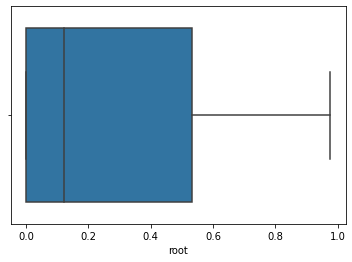

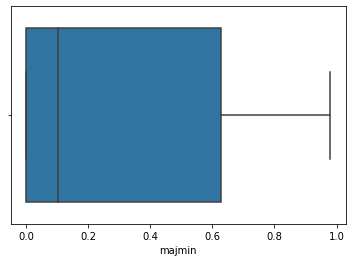

In [72]:
stft = chords_experiment.run_condition(chords.extract_stft_chroma_features, 
                                       {'tuning' : 0, 'norm' : 2, 'n_fft' : 4096}, 
                                       chords.viterbi_decode, 
                                       {'prob': 0.5}, 
                                       limit=-1, data_split="validation")
ax = sns.boxplot(x=stft["root"])
plt.show()
ax = sns.boxplot(x=stft["majmin"])
plt.show()

<div class="alert alert-block alert-success">
    
**What did you change? How much better was the root accuracy and majmin accuracy after the changes?**
    
</div>

*YOUR RESPONSE GOES HERE*

I changed the tuning, norm, and n_fft. The root and majmin accuracy both improved, and you can see the improvement from the plot above. 

## Part 7

<div class="alert alert-block alert-success">
    
1. Create a copy of the best performing chroma feature function in `chords.py`. In that copy, try pre-processing the input with librosa functions (maybe `librosa.decompose.hpss` or `librosa.core.salience`) to get only the harmonic components of the sound. This should reduce the amount of "noise" in the chroma featuers.
1. Add this as a new condition and re-run the experiment and plot its output.

</div>

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 29%|██▉       | 17/59 [01:15<02:53,  4.12s/it]C:\ProgramData\Anaconda3\lib\site-packages\mir_eval\chord.py:699: UserWarning: No reference chords were comparable to estimated chords, returning 0.
  warnings.warn("No reference chords were comparable "
100%|██████████| 59/59 [04:31<00:00,  4.60s/it]


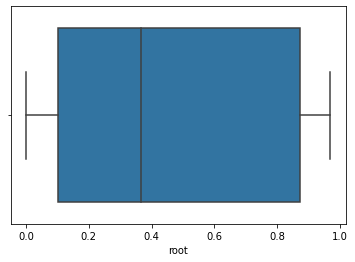

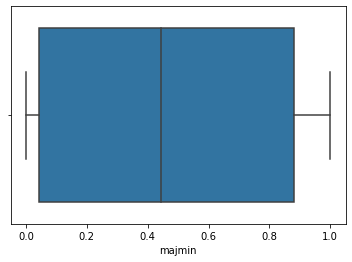

In [79]:
# YOUR CODE GOES HERE
import librosa
def extract_cens_chroma_features(audio_file_path, hop_length=512, sr=22050, **kwargs):
    """
    TODO: IMPLEMENT ME

    Open the audio at sample rate `sr` and extract chroma using `librosa.feature.chroma_cens`.
    Also, calculate the times array (when the beginning of each chroma feature frame occurs).

    Args:
        audio_file_path (str): Path to audio file.
        hop_length (int):
        sr (int): Sample rate
        **kwargs (dict): Additional keyword arguments that should be passed to `librosa.feature.chroma_cens`.

    Returns:
        times (np.ndarray): The array of times of each frame in seconds.
        chroma_features (np.ndarray [shape=(n_states, n_frames)] ):
    """
    y, sr = librosa.load(audio_file_path, sr=sr)
    D = librosa.stft(y)
    H, P = librosa.decompose.hpss(D)
    y_hat = librosa.istft(H)
    chroma_cens = librosa.feature.chroma_cens(y=y_hat, sr=sr, hop_length=hop_length, **kwargs)
    times = librosa.times_like(chroma_cens)
    # replace the following line with an actual implementation that returns something
    return times, chroma_cens

cens = chords_experiment.run_condition(extract_cens_chroma_features, 
                                       {}, 
                                       chords.viterbi_decode, 
                                       {'prob': 0.5}, 
                                       limit=-1, data_split="validation")
ax = sns.boxplot(x=cens["root"])
plt.show()
ax = sns.boxplot(x=cens["majmin"])
plt.show()

<div class="alert alert-block alert-success">
    
**How did this affect change performance?**
    
</div>

*YOUR RESPONSE GOES HERE*

The accuracy improve alot. The majmin accuracy improve more than the root accuracy.

## Part 8

<div class="alert alert-block alert-success">
    
1. Now, rerun the conditions with the test set and plot the results
</div>

INFO: Downloading ['audio_mic', 'annotations'] to /tmp\mir_datasets\guitarset
INFO: [audio_mic] downloading audio_mono-mic.zip
INFO: /tmp\mir_datasets\guitarset\audio_mono-mic\audio_mono-mic.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
INFO: [annotations] downloading annotation.zip
INFO: /tmp\mir_datasets\guitarset\annotation\annotation.zip already exists and will not be downloaded. Rerun with force_overwrite=True to delete this file and force the download.
 34%|███▎      | 40/119 [02:43<06:45,  5.13s/it]C:\ProgramData\Anaconda3\lib\site-packages\mir_eval\chord.py:699: UserWarning: No reference chords were comparable to estimated chords, returning 0.
  warnings.warn("No reference chords were comparable "
100%|██████████| 119/119 [07:58<00:00,  4.02s/it]


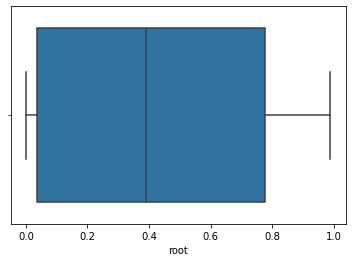

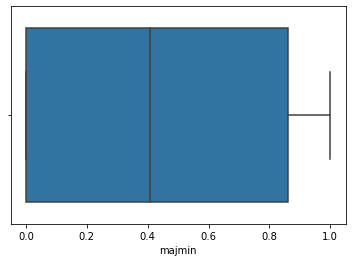

In [81]:
# YOUR CODE GOES HERE
cens = chords_experiment.run_condition(extract_cens_chroma_features, 
                                       {}, 
                                       chords.viterbi_decode, 
                                       {'prob': 0.5}, 
                                       limit=-1, data_split="test")
ax = sns.boxplot(x=cens["root"])
plt.show()
ax = sns.boxplot(x=cens["majmin"])
plt.show()

<div class="alert alert-block alert-success">
    
**Did the results stay the same? If not, how did they change?**
    
</div>

*YOUR RESPONSE GOES HERE*

The accuracy still improve, but not as much as validation dataset.